
### Link prediction: how to execute and evaluate methods on a real-world dataset?
#### Objectives: 
We should address the following points:

- What specific method(s) did you use from the class of methods you have investigated to find ***missing/spurious links***?
- Why did you ***choose*** this specific method?
- Which links were ***missing according to your method***?
- Does it ***seem logical*** that these links were missing, or does it seems like an artifact of the method used?
- How can you be sure that what you found ***is the truth***?
- How well did your method ***perform***?

#### Dataset: 
We are going to study the Jazz musicians dataset, some stat about the dataset:

- Number of nodes: 198 
- Edge Volume: 2742 
- Max Degree: 100
- Average Degree: 27.7
- Median Node Pair Distance: 2
- Mean Node Pair Distance: 2.2

In [1]:
from lib.utils import jazz_generator

k = 10 
k_folds = jazz_generator(k=k)
print(f"Number of folds: {len(k_folds)}")
for fold in k_folds: print(fold.shape)

--2023-10-18 16:55:01--  https://deim.urv.cat/~alexandre.arenas/data/xarxes/jazz.zip
Resolving deim.urv.cat (deim.urv.cat)... 84.88.201.135
Connecting to deim.urv.cat (deim.urv.cat)|84.88.201.135|:443... connected.


Archive:  {}/jazz.zip
  inflating: jazz.net                
Number of folds: 10
(548, 2)
(548, 2)
(548, 2)
(548, 2)
(548, 2)
(548, 2)
(548, 2)
(548, 2)
(548, 2)
(548, 2)


  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 15283 (15K) [application/zip]
Saving to: ‘{}/jazz.zip’

     0K .......... ....                                       100%  260K=0,06s

2023-10-18 16:55:06 (260 KB/s) - ‘{}/jazz.zip’ saved [15283/15283]



In [2]:
# Drawing the Graph 
from lib.utils import plot_full_graph
import networkx as nx 
import numpy as np 

edge_list = np.vstack(k_folds)
full_G = nx.from_edgelist(edge_list)

plot_full_graph(full_G,using_ipynb=True,save_plt=True)#,pos=nx.kamada_kawai_layout)

NameError: name 'k_folds' is not defined

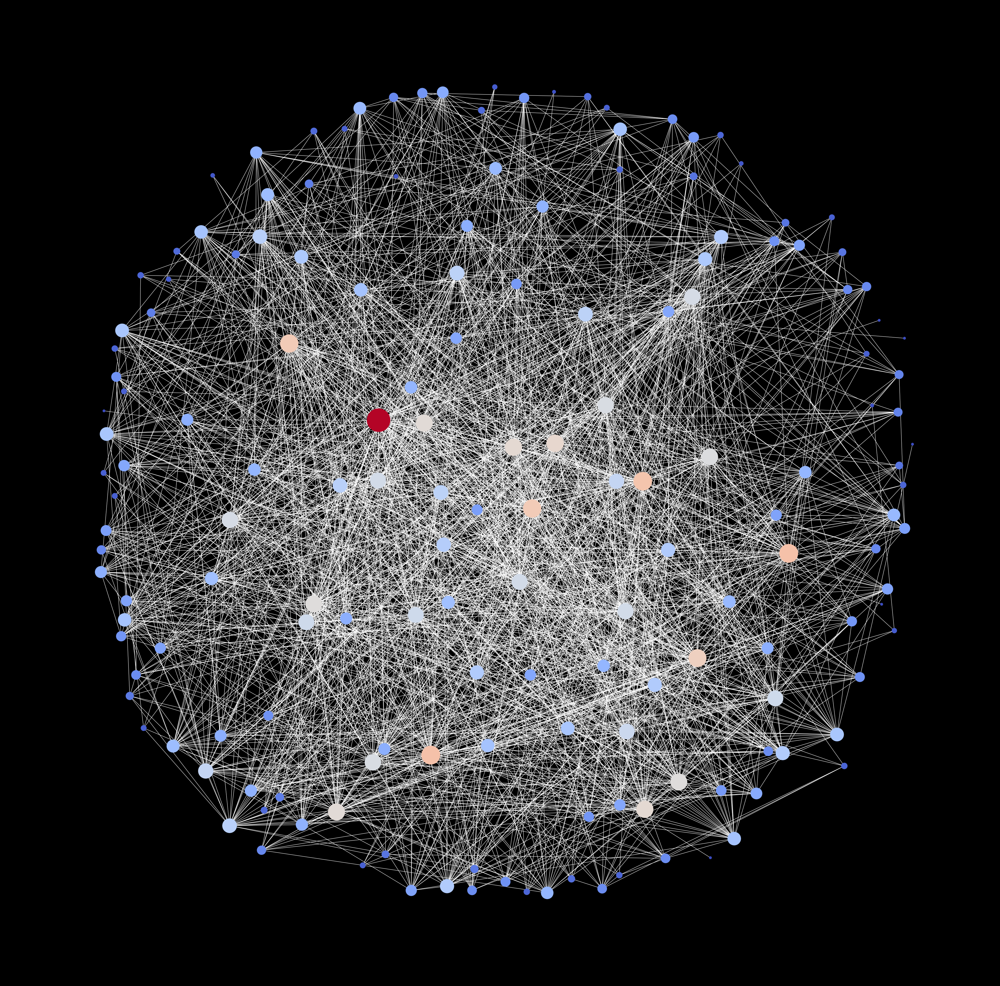

In [3]:
from lib.clique_study import biggest_clique_removal

no_clique_G, probe_set= biggest_clique_removal(k_folds)
plot_full_graph(no_clique_G,using_ipynb=True,save_plt=True)#,pos=nx.kamada_kawai_layout)

### Similarity Indices:
#### Local Similarity Indices:
The implemented indexes and their relative function are:


- Common Neighbours:        ***cn_score()***
- Leight Holme Newman:      ***leight_holme_newman()***
- Preferential Attachment:  ***preferential_attachment_wrapper()***
- Jaccard:                  ***jaccard_wrapper()***
- Adamic Adar:              ***adamic_adar_wrapper()***
- Resource Allocation:      ***resource_allocation_wrapper()***



### Standard Methods Tested:

In [4]:
from lib.utils import train_probe_split, from_el_to_nx
from lib.utils import accuracy_metric, auc_metric
from lib.local_similarity import * 

def execute(similarity_fun):
    accuracy,auc = [], []
    for index in range(len(k_folds)): 
        # Get the Train and Probe split for this fold  
        train_edge_list,probe_edge_list= train_probe_split(k_folds,index)

        # Trainsform the train edge list to a networkx Graph  
        train_G, _ = from_el_to_nx(train_edge_list)

        # Get the similarity scores for the train Graph 
        scores = similarity_fun(train_G)  

        accuracy.append(accuracy_metric(scores,probe_edge_list))
        auc.append(auc_metric(scores,train_edge_list,probe_edge_list))
    
    mean_accuracy, mean_auc = sum(accuracy)/k ,sum(auc)/k 
    return mean_accuracy, mean_auc

mean_accuracy, mean_auc = execute(cn_score)
print(f"COMMON NEIGHBOURS:\n\tACCURACY={mean_accuracy}\n\tAUC={mean_auc}\n")

mean_accuracy, mean_auc = execute(leight_holme_newman_1)
print(f"{'leight holme newman 1'.upper()}:\n\tACCURACY={mean_accuracy}\n\tAUC={mean_auc}\n")

mean_accuracy, mean_auc = execute(preferential_attachment_wrapper)
print(f"PREFERENTIAL ATTACHMENT:\n\tACCURACY={mean_accuracy}\n\tAUC={mean_auc}\n")

mean_accuracy, mean_auc = execute(adamic_adar_wrapper)
print(f"ADAMIC ADAR:\n\tACCURACY={mean_accuracy}\n\tAUC={mean_auc}\n")

mean_accuracy, mean_auc = execute(resource_allocation_wrapper)
print(f"RESOURCE ALLOCATION:\n\tACCURACY={mean_accuracy}\n\tAUC={mean_auc}\n")


Common Neighbours:
	ACCURACY=0.07682481751824818
	AUC=0.281

LEIGHT HOLME NEWMAN 1:
	ACCURACY=0.03102189781021898
	AUC=0.27599999999999997

PREFERENTIAL ATTACHMENT:
	ACCURACY=0.022445255474452554
	AUC=0.07800000000000003

ADAMIC ADAR:
	ACCURACY=0.0813868613138686
	AUC=0.281

RESOURCE ALLOCATION:
	ACCURACY=0.09051094890510948
	AUC=0.282



### Spectral Similarity:

In [3]:
from lib.clique_study import spectral_similarity,biggest_clique_removal
from lib.utils import accuracy_metric, auc_metric
from lib.utils import train_probe_split, from_el_to_nx

def execute_spectral_similarity(n_class):
    accuracy,auc = [], []
    for index in range(len(k_folds)): 
        train_edge_list,probe_edge_list= train_probe_split(k_folds,index)
        train_G, _ = from_el_to_nx(train_edge_list)

        scores = spectral_similarity(train_G,n_class,reverse=True)
        accuracy.append(accuracy_metric(scores,probe_edge_list))
        auc.append(auc_metric(scores,train_edge_list,probe_edge_list))
    
    mean_accuracy, mean_auc = sum(accuracy)/k ,sum(auc)/k 
    return mean_accuracy, mean_auc


mean_accuracy, mean_auc = execute_spectral_similarity(20)
print(f"SPECTRAL SIMILARITY:\n\tACCURACY={mean_accuracy}\n\tAUC={mean_auc}\n")

APPLY EIGEN GAP: 
Eigen Values:
-0: -8.659739592076221e-15 
-1: 0.5718681668469464 
-2: 0.6978861792149469 
-3: 0.8725391896136668 
-4: 0.929584245923986 
-5: 0.9785639015807419 
-6: 0.9848783596033953 
-7: 1.813589022340399 
-8: 1.965315381347209 
-9: 2.0327851969484048 
-10: 2.5349860607556236 
-11: 2.9032808911789507 
-12: 3.2490868704077838 
-13: 3.416887841258753 
-14: 3.621387256329138 
-15: 3.9393432364711796 
-16: 4.249265335354668 
-17: 4.496211248273 
-18: 4.585647563607768 
-19: 5.417081880886572 
APPLY EIGEN GAP: 
Eigen Values:
-0: -5.218048215738236e-15 
-1: 0.571907764743581 
-2: 0.6980035931696008 
-3: 0.8724269061601146 
-4: 0.9297153951108346 
-5: 0.9786824287618962 
-6: 0.9857246624625138 
-7: 1.817996703698874 
-8: 1.9654154312544883 
-9: 2.034015194625006 
-10: 2.535084421338468 
-11: 2.9067307482384015 
-12: 3.2486212880254843 
-13: 3.4173996434450076 
-14: 3.6207342467512786 
-15: 3.938811816882088 
-16: 4.248586405619857 
-17: 4.504071468192868 
-18: 4.5827837994

In [11]:
from lib.clique_study import spectral_similarity,biggest_clique_removal
from lib.utils import accuracy_metric, auc_metric
from lib.local_similarity import * 
import os 

# Get the File 
G,probe_edge_list = biggest_clique_removal(k_folds)

# From Worse to Best 
scores = spectral_similarity(G,20)
comparison_scores = resource_allocation_wrapper(G)
comparison_scores.sort(key=lambda x: x[2])

# SAVE FILES 
# Check if the dir exists
base_path = os.path.join( os.getcwd(),"outputs")
if not os.path.isdir(base_path): os.mkdir(base_path)

# Spectrality scores file
file = open(os.path.join(base_path,"spectral.txt"),"w")
str_scores = [" ".join(map(lambda x: str(x),line)) + "\n" for line in scores ]
print(str_scores)
file.writelines(str_scores)

# Other scores files
file = open(os.path.join(base_path,"resource_allocation.txt"),"w")
str_scores = [" ".join(map(lambda x: str(x),line)) + "\n" for line in comparison_scores]
file.writelines(str_scores)


def probe_set_scores(scores,probe_edge_list):
    probe_edge_list = list(probe_edge_list)
    accuracy = accuracy_metric(scores,probe_edge_list)
    auc = auc_metric(scores,list(G.edges()),probe_edge_list)
    return accuracy, auc

accuracy,auc = probe_set_scores(scores,probe_edge_list)
print(f"SPECTRAL SIMILARITY:\n\tACCURACY={accuracy}\n\tAUC={auc}\n")

APPLY EIGEN GAP: 
Eigen Values:
-0: -1.0769163338864018e-14 
-1: 0.5719453354454141 
-2: 0.6979826585573629 
-3: 0.8713551307818961 
-4: 0.9297219415073597 
-5: 0.9786788106560186 
-6: 0.9856829575496376 
-7: 1.8149852468918999 
-8: 1.942681561888936 
-9: 2.032605449208283 
-10: 2.5385882991585134 
-11: 2.906043815595043 
-12: 3.249542305502402 
-13: 3.4184546537708345 
-14: 3.6223181944140768 
-15: 3.9407341716331 
-16: 4.248646827680004 
-17: 4.499981350320094 
-18: 4.584150232081383 
-19: 5.359395762712505 
['3 17 -0.00040023942719633125\n', '4 6 -0.00017866514521788107\n', '1 6 -0.00013723711383466114\n', '4 17 -0.00013014516353543944\n', '6 145 -0.00012213385263886114\n', '2 47 -0.00011440662533015058\n', '17 47 -0.00011305137769143722\n', '5 6 -0.00010529415485420541\n', '1 21 -0.00010400672837467642\n', '1 145 -0.00010059478952135328\n', '2 145 -9.818566096043452e-05\n', '1 47 -9.53499743034603e-05\n', '17 145 -8.410085579046299e-05\n', '2 21 -7.648981839617709e-05\n', '17 37 -7